# Big Data Mining 52002/52019 2023_24 Final Assignment Part 3: Spark  [24 pts]

In this problem, you will learn how to do basic data analytics in Spark RDDs and Dataframes.
All the operations/computation should be done in Spark (either RDDs/DFs- as required), unless otherwise told.

**Guidelines:**  
1. Fill and execute this notebook with Spark commands. Save the resulting ipynb file with the results before submitting.
2. Please write efficient  code. Points may be taken off for inefficiency.
3. The class moodle page has a lot of Spark resources - use them!  
4.Your plots should be clear, with titles, and with propoer x-y labels.

**Grading:** There are $4$ subquestions in this part, each worth $6$ points (24 pts total)

FOR SUBMISSION:
PLEASE SUBMIT THE FOLLOWING:
1. Your fully executed IPYNB file (with the expected output). File-->Export-->iPython notebook.
2. A PDF/HTML import of your executed IPYNB file (with the expected output)
<!-- 3. The ipynb/html outputs won't show the visualizations. So please upload your visualizations as png files, named after their appropriate question (e.g. `vis_2c`).  -->

SUBMISSIONS WITHOUT OUTPUTS WILL NOT BE GRADED!!


This data set represents thousands of loans made through the Lending Club platform, which is a platform that allows individuals to lend to other individuals.

Source
This data comes from Lending Club (https://www.lendingclub.com/info/statistics.action), which provides a very large, open set of data on the people who received loans through their platform.

A link to a complete list explaining the schema:  
https://www.openintro.org/data/index.php?data=loans_full_schema


## Part 0 -  Retrieving the data!
(0 pts - Just execute the commands ...)

.1) Using the `urllib` library  and the method `urllib.request.urlretrieve`, retrieve the files specified in the `files_path` into `files_tmp_path` looping over the endings.

In [0]:
files_path = "https://resources.lendingclub.com/LoanStats3{}.csv.zip"
files_tmp_path =  "/tmp/LoanStats3{}.csv.zip"
endings = ["a","b","c","d"]

In [0]:
import urllib
files_path = "https://resources.lendingclub.com/LoanStats3{}.csv.zip"
files_tmp_path =  "/tmp/LoanStats3{}.csv.zip"
endings = ["a","b","c","d"]
for end in endings:
  urllib.request.urlretrieve(files_path.format(end),files_tmp_path.format(end))
  print("Finished with file ending with:", end)


Finished with file ending with: a
Finished with file ending with: b
Finished with file ending with: c
Finished with file ending with: d


.2) Using the magic command `%sh` for accessing shell, execute a loop over the file endigs in the `files_tmp_path` unziping them into `temp{}.csv`. After each unzip, execute the following command: `tail -n +2 LoanStats3{}.csv > temp{}.csv` with the appropriate changes to account for file ending, followed by a removal of the `LoanStats3{}.csv` files.

In [0]:
%sh
for i in 'a' 'b' 'c' 'd'
do
  unzip /tmp/LoanStats3$i.csv.zip
  tail -n +2 LoanStats3$i.csv > temp$i.csv
  rm LoanStats3$i.csv
done

Archive:  /tmp/LoanStats3a.csv.zip
  inflating: LoanStats3a.csv         
Archive:  /tmp/LoanStats3b.csv.zip
  inflating: LoanStats3b.csv         
Archive:  /tmp/LoanStats3c.csv.zip
  inflating: LoanStats3c.csv         
Archive:  /tmp/LoanStats3d.csv.zip
  inflating: LoanStats3d.csv         


.3) using `dbutils.fs.mv` and a loop , move the files into the databricks file system (dbfs) at `"dbfs:/tmp/LoanStats3{}.csv"`

In [0]:
for end in endings:
  dbutils.fs.mv("file:/databricks/driver/temp{}.csv".format(end), "dbfs:/tmp/LoanStats3{}.csv".format(end))


.4) Load the entire dataset into a spark dataframe, infering the schema. Display the dataframe `df`.

In [0]:
df = spark.read.format("csv").option("inferSchema", "true").option("header","true").load("dbfs:/tmp/LoanStats3*")
# df = df.dropna()
# df.cache()
display(df)


id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_act_il,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit,revol_bal_joint,sec_app_earliest_cr_line,sec_app_inq_last_6mths,sec_app_mort_acc,sec_app_open_acc,sec_app_revol_util,sec_app_open_act_il,sec_app_num_rev_accts,sec_app_chargeoff_within_12_mths,sec_app_collections_12_mths_ex_med,sec_app_mths_since_last_major_derog,hardship_flag,hardship_type,hardship_reason,hardship_status,deferral_term,hardship_amount,hardship_start_date,hardship_end_date,payment_plan_start_date,hardship_length,hardship_dpd,hardship_loan_status,orig_projected_additional_accrued_interest,hardship_payoff_balance_amount,hardship_last_payment_amount,debt_settlement_flag,debt_settlement_flag_date,settlement_status,settlement_date,settlement_amount,settlement_percentage,settlement_term
null,null,12000,12000,12000.0,36 months,11.99%,398.52,B,B3,LTC,10+ years,MORTGAGE,130000,Source Verified,Dec-2013,Fully Paid,n,null,null,debt_consolidation,Debt consolidation,809xx,CO,13.03,0,Nov-1997,1,null,null,9,0,10805,67%,19,f,0.00,0.00,14346.479049698,14346.48,12000.00,2346.48,0.0,0.0,0.0,Jan-2017,398.28,null,Jul-2018,0,null,1,Individual,null,null,null,0,0,327264,null,null,null,null,null,null,null,null,null,null,null,16200,null,null,null,4,36362,3567,93,0.0,0,173,193,4,4,3,85,null,4,null,0,3,5,4,4,8,5,8,5,9,null,0,0,3,100.0,1.0,0,0,365874,44327,10700,57674,null,null,null,null,null,null,null,null,null,null,null,N,null,null,null,null,null,null,null,null,null,null,null,null,null,null,N,null,null,null,null,null,null
null,null,15000,15000,15000.0,36 months,8.90%,476.3,A,A5,aircraft maintenance engineer,2 years,MORTGAGE,63000,Not Verified,Dec-2013,Fully Paid,n,null,Borrower added on 12/31/13 > To pay Home Depot Credit Services card for my recent kitchen upgrade and pay off my Capital One credit card balance,debt_consolidation,Pay off,334xx,FL,16.51,0,Mar-1998,0,34,null,8,0,11431,74.2%,29,w,0.00,0.00,17146.7251036266,17146.73,15000.00,2146.73,0.0,0.0,0.0,Jan-2017,476.23,null,Oct-2020,0,34,1,Individual,null,null,null,0,1514,272492,null,null,null,null,null,null,null,null,null,null,null,15400,null,null,null,3,38927,2969,79.1,0.0,0,147,189,24,13,4,24,75,12,75,3,3,4,3,10,8,6,17,4,8,0,0,0,0,89.3,66.7,0,0,288195,39448,14200,33895,null,null,null,null,null,null,null,null,null,null,null,N,null,null,null,null,null,null,null,null,null,null,null,null,null,null,N,null,null,null,null,null,null
null,null,24000,24000,24000.0,36 months,13.53%,814.8,B,B5,driver,10+ years,MORTGAGE,100000,Verified,Dec-2013,Ful

In [0]:
df.count()

Out[6]: 887449

In [0]:
df_short = df.select('loan_amnt','term','grade','int_rate','home_ownership','annual_inc','purpose','title','zip_code','addr_state','loan_status')
df_short = df_short.dropna()
df_short.cache()
display(df_short)

loan_amnt,term,grade,int_rate,home_ownership,annual_inc,purpose,title,zip_code,addr_state,loan_status
12000,36 months,B,11.99%,MORTGAGE,130000,debt_consolidation,Debt consolidation,809xx,CO,Fully Paid
15000,36 months,A,8.90%,MORTGAGE,63000,debt_consolidation,Pay off,334xx,FL,Fully Paid
24000,36 months,B,13.53%,MORTGAGE,100000,credit_card,credit card,493xx,MI,Fully Paid
12000,36 months,B,13.53%,RENT,40000,debt_consolidation,Debt consolidation,871xx,NM,Fully Paid
10000,36 months,B,9.67%,MORTGAGE,102000,debt_consolidation,Clean Up,027xx,MA,Fully Paid
12000,36 months,B,10.99%,RENT,60000,debt_consolidation,No Regrets,281xx,NC,Fully Paid
11100,36 months,C,14.98%,MORTGAGE,90000,other,Other,103xx,NY,Fully Paid
7550,36 months,C,16.24%,RENT,28000,debt_consolidation,Debt consolidation,951xx,CA,Fully Paid
27600,60 months,D,19.97%,MORTGAGE,73000,debt_consolidation,Consolidation of debt and home improve.,802xx,CO,Charged Off
3000,36 months,B,12.85%,RENT,25000,debt_consolidation,debt,322xx,FL,Fully Paid


In [0]:
df_short.count()

Out[8]: 887286

In [0]:
df_short.schema

Out[9]: StructType([StructField('loan_amnt', IntegerType(), True), StructField('term', StringType(), True), StructField('grade', StringType(), True), StructField('int_rate', StringType(), True), StructField('home_ownership', StringType(), True), StructField('annual_inc', StringType(), True), StructField('purpose', StringType(), True), StructField('title', StringType(), True), StructField('zip_code', StringType(), True), StructField('addr_state', StringType(), True), StructField('loan_status', StringType(), True)])

## Part 1 -  RDD Operations
(YOUR ACTUAL ANSWERS START HERE!)

In [0]:
# Run this part to convert the dataframe into an RDD
loan_rdd = df_short.rdd
loan_rdd.cache()
loan_rdd.take(1)

Out[10]: [Row(loan_amnt=12000, term=' 36 months', grade='B', int_rate=' 11.99%', home_ownership='MORTGAGE', annual_inc='130000', purpose='debt_consolidation', title='Debt consolidation', zip_code='809xx', addr_state='CO', loan_status='Fully Paid')]

Q1a) Use RDD operations  MAP-Reduce to
1. count the total value of all loan amounts.   
2. count the total value of  loan amounts where the value of the home ownership field is "MORTGAGE".   
3. Find the maximum and minimum loan amount (regardles of home ownersihp).

SOLUTION:

In [0]:
# Your code for the 3 tasks here:

# Task 1: count the total value of all loan amounts.
total_loan_amount = loan_rdd.map(lambda row: row.loan_amnt).reduce(lambda a, b: a + b)
print(f"Total value of all loan amounts: {total_loan_amount}")

# Task 2: count the total value of loan amounts where the value of the home ownership field is "MORTGAGE".
total_loan_mortgage = loan_rdd \
    .filter(lambda row: row.home_ownership == 'MORTGAGE') \
    .map(lambda row: row.loan_amnt) \
    .reduce(lambda a, b: a + b)
print(f"Total value of loan amounts with home ownership 'MORTGAGE': {total_loan_mortgage}")

# Task 3: Find the maximum and minimum loan amount (regardles of home ownersihp).
max_loan_amount = loan_rdd.map(lambda row: row.loan_amnt).max()
min_loan_amount = loan_rdd.map(lambda row: row.loan_amnt).min()

print(f"Maximum loan amount: {max_loan_amount}")
print(f"Minimum loan amount: {min_loan_amount}")


Total value of all loan amounts: 13092007200
Total value of loan amounts with home ownership 'MORTGAGE': 7262439550
Maximum loan amount: 35000
Minimum loan amount: 500


Q1b) Use RDD operations  (MAP-Reduce) to calculate the average interest rate per each loan grade.  
Hint: you can separate the calculation into independent MAP-Reduce operations.   
Print a sorted dictionary of the different grades as `items`, and their average interest rates as `values`.   


In [0]:
# Your code here:
# Clean the interest rate and map to (grade, interest rate)
cleaned_interest_rdd = loan_rdd.map(lambda row: (row.grade, float(row.int_rate.replace('%', ''))))

# Sum interest rates for each grade
sum_interest_rdd = cleaned_interest_rdd.reduceByKey(lambda a, b: a + b)

# Count loans for each grade
count_loans_rdd = loan_rdd.map(lambda row: (row.grade, 1)).reduceByKey(lambda a, b: a + b)

# Join sums and counts, then calculate average
average_interest_rate_rdd = sum_interest_rdd.join(count_loans_rdd).map(lambda x: (x[0], x[1][0] / x[1][1]))

# Collect as a dictionary and sort
average_interest_rate = average_interest_rate_rdd.collectAsMap()

sorted_average_interest_rate = dict(sorted(average_interest_rate.items()))

# Print the sorted dictionary
for grade, avg_rate in sorted_average_interest_rate.items():
    print(f"Grade: {grade}, Average Interest Rate: {avg_rate:.2f}%")

Grade: A, Average Interest Rate: 7.24%
Grade: B, Average Interest Rate: 10.83%
Grade: C, Average Interest Rate: 13.98%
Grade: D, Average Interest Rate: 17.17%
Grade: E, Average Interest Rate: 19.89%
Grade: F, Average Interest Rate: 23.58%
Grade: G, Average Interest Rate: 25.62%


Q1c) What are the 2 top reasons to apply for a loan?   
What can you say about the distribution of all the rest of the reasons?



In [0]:
# Your code here:

purpose_count_rdd = loan_rdd.map(lambda row: (row.purpose, 1))

# Reduce by key to get total counts per purpose
total_purpose_count_rdd = purpose_count_rdd.reduceByKey(lambda a, b: a + b)

# Sort by the count in descending order
sorted_purpose_count_rdd = total_purpose_count_rdd.sortBy(lambda x: x[1], ascending=False)

sorted_purpose_count = sorted_purpose_count_rdd.collect()

# Print the top 2 reasons
top_2_reasons = sorted_purpose_count[:2]
print("Top 2 reasons for applying for a loan:")
for reason, count in top_2_reasons:
    print(f"{reason}: {count} applications")

# Filter out reasons with less than 2 applications for a focused summary
filtered_reasons = [(reason, count) for reason, count in sorted_purpose_count if count >= 2]
total_filtered_applications = sum(count for _, count in filtered_reasons)

# Deduct applications related to the top 2 most common reasons to summarize the rest
other_filtered_applications = total_filtered_applications - sum(count for _, count in filtered_reasons[:2])

print("\nFiltered Distribution of All Other Reasons:")
print(f"Combined applications for all other purposes (with at least 2 applications): {other_filtered_applications}")
print(f"This represents {(other_filtered_applications / total_filtered_applications) * 100:.2f}% of the total applications among reasons with at least 2 applications.")

# Display the detailed view of the reasons with at least 2 applications, excluding the top 2
for reason, count in filtered_reasons[2:]:
    percentage = (count / total_filtered_applications) * 100
    print(f"{reason}: {count} applications, {percentage:.2f}% of total")


Top 2 reasons for applying for a loan:
debt_consolidation: 524092 applications
credit_card: 206114 applications

Filtered Distribution of All Other Reasons:
Combined applications for all other purposes (with at least 2 applications): 156827
This represents 17.68% of the total applications among reasons with at least 2 applications.
home_improvement: 51803 applications, 5.84% of total
other: 42852 applications, 4.83% of total
major_purchase: 17261 applications, 1.95% of total
small_business: 10343 applications, 1.17% of total
car: 8857 applications, 1.00% of total
medical: 8532 applications, 0.96% of total
moving: 5414 applications, 0.61% of total
vacation: 4736 applications, 0.53% of total
house: 3702 applications, 0.42% of total
wedding: 2343 applications, 0.26% of total
renewable_energy: 575 applications, 0.06% of total
educational: 409 applications, 0.05% of total


The loan application reasons beyond the leading categories of debt consolidation and credit card payments highlight diverse financial objectives, from home improvement to funding small businesses. These secondary reasons account for 17.68% of total applications, showing a broad spectrum of borrower needs including personal investments and life events. This variety underscores the multifaceted nature of financial borrowing, where beyond debt management, individuals also seek loans for home enhancements, vehicle purchases, and entrepreneurial ventures.

Q1d) Choose interesting statistics, analysis, or visualizations to perform on the dataset with the help of Spark operations.  
 Make sure your analysis brings out interesting trends, effects, or non-trivial aspects of the data. You may use the full or short loan dataset.

SOLUTION:

+------------------+-------------------+
|           purpose|average_loan_amount|
+------------------+-------------------+
|debt_consolidation| 15428.689476275158|
|    small_business| 15425.896741757711|
|       credit_card| 15339.205730809164|
|             house| 14799.425985953538|
|  home_improvement| 14320.906607725421|
|    major_purchase| 11604.097387173397|
|           wedding| 10472.129748186086|
|  renewable_energy|  9948.304347826086|
|             other|   9890.53428078036|
|           medical|  9017.747890295359|
|               car|   8882.51383086824|
|            moving|  7889.818064277798|
|       educational|  6625.733496332518|
|          vacation|  6289.537584459459|
+------------------+-------------------+

+----------+---------------------+
|addr_state|average_interest_rate|
+----------+---------------------+
|        HI|   13.913496749887118|
|        AL|   13.756918953610429|
|        AK|   13.635279102429335|
|        TN|   13.574468683280545|
|        OK|   1

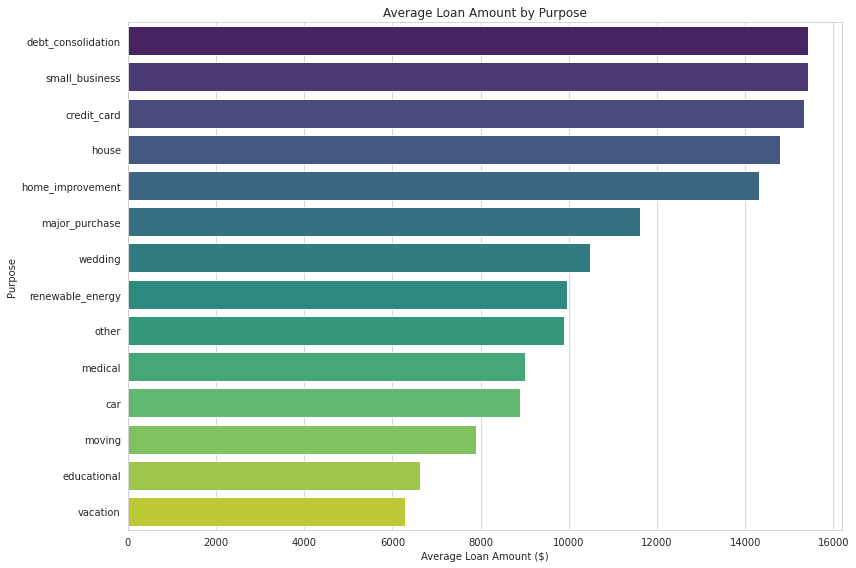

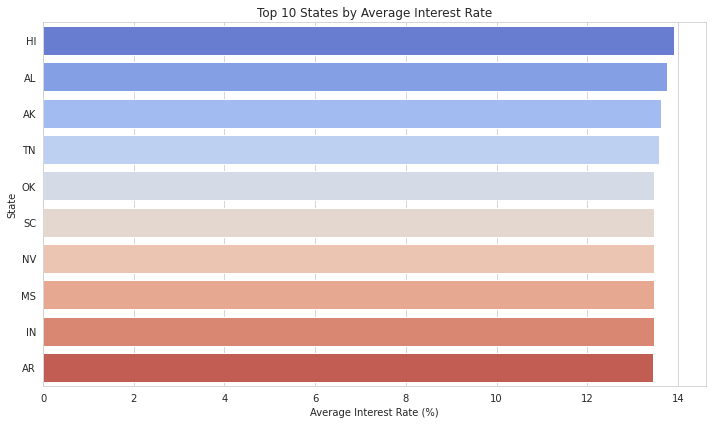

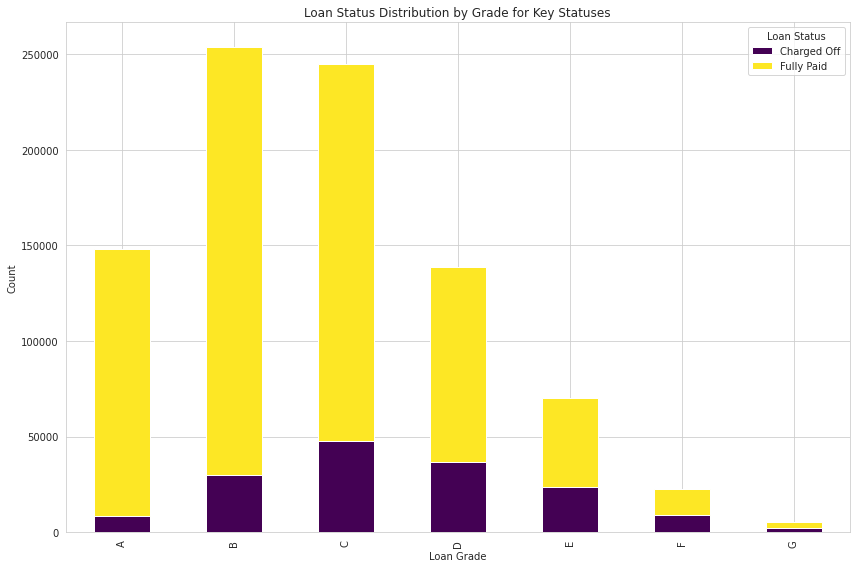

In [0]:
# Your code here. You may use the data in an RDD or data-frame format

from pyspark.sql.functions import col, count as sql_count
from pyspark.sql.functions import regexp_replace, col
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pyspark.sql.functions import avg


# Count the applications per purpose and filter for those with at least 2 applications
purposes_with_min_applications = df_short.groupBy('purpose') \
    .agg(sql_count('*').alias('num_applications')) \
    .filter(col('num_applications') >= 2)

# Ensure we are joining on the 'purpose' column correctly
df_short_filtered = df_short.join(purposes_with_min_applications, on='purpose', how='inner')
# Remove '%' from 'int_rate' and convert to float
df_short_filtered = df_short_filtered.withColumn('int_rate', regexp_replace('int_rate', '%', ''))
df_short_filtered = df_short_filtered.withColumn('int_rate', col('int_rate').cast('float'))

#Analysis 1: Loan Amount vs. Purpose 
avg_loan_amount_by_purpose_filtered = df_short_filtered.groupBy('purpose') \
    .agg(avg('loan_amnt').alias('average_loan_amount')) \
    .orderBy('average_loan_amount', ascending=False)
avg_loan_amount_by_purpose_filtered.show()

#Analysis 2: Interest Rates Across Different States 

avg_interest_rate_by_state_filtered = df_short_filtered.withColumn('int_rate', df_short_filtered['int_rate'].cast('float')) \
    .groupBy('addr_state') \
    .agg(avg('int_rate').alias('average_interest_rate')) \
    .orderBy('average_interest_rate', ascending=False)
avg_interest_rate_by_state_filtered.show()


#Analysis 3: Loan Status Distribution 
loan_status_distribution_filtered = df_short_filtered.groupBy('grade', 'loan_status') \
    .count() \
    .orderBy('grade', 'count', ascending=False)
loan_status_distribution_filtered.show()

# Set the visual style of the plots
sns.set_style("whitegrid")

#Visualization 1: Average Loan Amount by Purpose
# Convert to Pandas DataFrame
avg_loan_amount_pd = avg_loan_amount_by_purpose_filtered.toPandas()

# Plot
plt.figure(figsize=(12, 8))
sns.barplot(x='average_loan_amount', y='purpose', data=avg_loan_amount_pd, palette='viridis')
plt.title('Average Loan Amount by Purpose')
plt.xlabel('Average Loan Amount ($)')
plt.ylabel('Purpose')
plt.tight_layout()
plt.show()

#Visualization 2: Top N States by Average Interest Rate
avg_interest_rate_pd = avg_interest_rate_by_state_filtered.toPandas()
# Sort and select the top 10 states
N = 10
top_states_interest_rate_pd = avg_interest_rate_pd.sort_values(by='average_interest_rate', ascending=False).head(N)

plt.figure(figsize=(10, 6))
sns.barplot(x='average_interest_rate', y='addr_state', data=top_states_interest_rate_pd, palette='coolwarm', edgecolor='w')
plt.title(f'Top {N} States by Average Interest Rate')
plt.xlabel('Average Interest Rate (%)')
plt.ylabel('State')
plt.tight_layout()
plt.show()


#Visualization 3: Loan Status Distribution by Grade
loan_status_distribution_pd = loan_status_distribution_filtered.toPandas()

# Filter for relevant statuses
relevant_statuses = ['Fully Paid', 'Charged Off', 'Default']
filtered_status_distribution_pd = loan_status_distribution_pd[loan_status_distribution_pd['loan_status'].isin(relevant_statuses)]

pivot_df = filtered_status_distribution_pd.pivot(index='grade', columns='loan_status', values='count').fillna(0)

# Plot
pivot_df.plot(kind='bar', stacked=True, figsize=(12, 8), colormap='viridis')
plt.title('Loan Status Distribution by Grade for Key Statuses')
plt.xlabel('Loan Grade')
plt.ylabel('Count')
plt.legend(title='Loan Status')
plt.tight_layout()
plt.show()
